<a href="https://colab.research.google.com/github/audwls4545/metaverse/blob/main/orange_resnet34_version_5_new_data1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install koreanize-matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.9/7.9 MB 29.8 MB/s eta 0:00:00


In [ ]:
import matplotlib.pyplot as plt
import koreanize_matplotlib

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
from torchvision import datasets, models, transforms
import numpy as np
import time

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
import os
import shutil

directory_list = [
    './dataset/train/',
    './dataset/test/'
]

for dir in directory_list:
    if not os.path.isdir(dir):
        os.makedirs(dir)

In [ ]:
#수집한 이미지를 학습데이터 평가데이터로 구분하는 함수
import glob

input_path = "/content/drive/MyDrive/colab_data_file/dataset/"

def dataset_split(query,train_cnt):

    for dir in directory_list:
        if not os.path.isdir(dir+query):
            os.makedirs(dir+query)

    cnt = 0
    for file_name in os.listdir(input_path+query):
        #print(file_name)
        if cnt < train_cnt:
            print(f'trainset : {file_name}')
            shutil.copy(input_path+query+'/'+file_name,'./dataset/train/'+query+'/'+file_name)
        else:
            print(f'testset : {file_name}')
            shutil.copy(input_path+query+'/'+file_name,'./dataset/test/'+query+'/'+file_name)

        cnt += 1

    #shutil.rmtree(query)

In [ ]:
dataset_split('귤',85)
dataset_split('천혜향',85)
dataset_split('한라봉',85)
dataset_split('레드향',85)
dataset_split('자몽',85)

trainset : image_1.jpg
trainset : image_2.jpg
trainset : image_3.jpg
trainset : image_4.jpg
trainset : image_5.png
trainset : image_6.png
trainset : image_7.JPG
trainset : image_8.JPG
trainset : image_9.jpg
trainset : image_10.jpg
trainset : image_11.jpg
trainset : image_12.jpg
trainset : image_13.png
trainset : image_14.png
trainset : image_15.png
trainset : image_16.jpg
trainset : image_17.jpg
trainset : image_18.jpg
trainset : image_19.jpg
trainset : image_20.jpg
trainset : image_21.jpg
trainset : image_22.jpg
trainset : image_23.jpg
trainset : image_24.jpg
trainset : image_25.jpg
trainset : image_26.jpg
trainset : image_27.jpg
trainset : image_28.jpg
trainset : image_29.jpg
trainset : image_30.JPG
trainset : image_31.JPG
trainset : image_32.jpg
trainset : image_33.jpg
trainset : image_34.jpg
trainset : image_35.jpg
trainset : image_36.jpg
trainset : image_37.jpg
trainset : image_38.jpg
trainset : image_41.png
trainset : image_39.jpg
trainset : image_40.JPG
trainset : image_42.JPG
t

In [ ]:
transform_train = transforms.Compose([
    #transforms.RandomResizedCrop(size=(224,224), ratio=(3/4,4/3)),
    #transforms.RandomRotation(degrees=(-30,30)),
    transforms.Resize((224,224)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

transform_test = transforms.Compose([
    transforms.Resize((224,224)),
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225])
])

In [ ]:
train_datasets = datasets.ImageFolder('./dataset/train',transform_train)
test_datasets = datasets.ImageFolder('./dataset/test',transform_test)

In [ ]:
train_dataloader = torch.utils.data.DataLoader(train_datasets,shuffle=True,batch_size=4)
test_dataloader = torch.utils.data.DataLoader(test_datasets,shuffle=True,batch_size=4)

In [ ]:
def imshow(img, title):
    print(img.numpy().shape) #tensor를 numpy로 변환
    img = img.numpy().transpose((1,2,0)) #w,h,c

    std = np.array([0.229,0.224,0.225])
    mean = np.array([0.485,0.456,0.406])

    img = std * img + mean
    img = np.clip(img,0,1)

    plt.imshow(img)
    plt.title(title)
    plt.show()

In [ ]:
class_names = train_datasets.classes
print('클래스:', class_names)

클래스: ['귤', '레드향', '자몽', '천혜향', '한라봉']


(3, 228, 906)


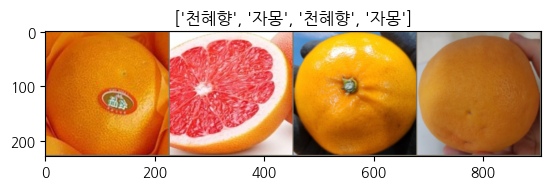

In [ ]:
iter_ = iter(train_dataloader)

data, labels = next(iter_)
out = torchvision.utils.make_grid(data)

imshow(out,title=[class_names[x] for x in labels])

In [ ]:
model = models.resnet34(pretrained=True)
print(model)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [ ]:
for param in model.parameters():
    param.requires_grad = False

fc_input_features = model.fc.in_features
fc_input_features

512

In [ ]:
model.fc = nn.Linear(fc_input_features, 5)

for name,module in model.named_parameters():
    print(name , module.requires_grad)

conv1.weight False
bn1.weight False
bn1.bias False
layer1.0.conv1.weight False
layer1.0.bn1.weight False
layer1.0.bn1.bias False
layer1.0.conv2.weight False
layer1.0.bn2.weight False
layer1.0.bn2.bias False
layer1.1.conv1.weight False
layer1.1.bn1.weight False
layer1.1.bn1.bias False
layer1.1.conv2.weight False
layer1.1.bn2.weight False
layer1.1.bn2.bias False
layer1.2.conv1.weight False
layer1.2.bn1.weight False
layer1.2.bn1.bias False
layer1.2.conv2.weight False
layer1.2.bn2.weight False
layer1.2.bn2.bias False
layer2.0.conv1.weight False
layer2.0.bn1.weight False
layer2.0.bn1.bias False
layer2.0.conv2.weight False
layer2.0.bn2.weight False
layer2.0.bn2.bias False
layer2.0.downsample.0.weight False
layer2.0.downsample.1.weight False
layer2.0.downsample.1.bias False
layer2.1.conv1.weight False
layer2.1.bn1.weight False
layer2.1.bn1.bias False
layer2.1.conv2.weight False
layer2.1.bn2.weight False
layer2.1.bn2.bias False
layer2.2.conv1.weight False
layer2.2.bn1.weight False
layer2.2.bn1

In [ ]:
%matplotlib inline
!pip install tensorboardX

In [ ]:
# SummaryWriter 인스턴스 생성
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [ ]:
class EarlyStopping:
    """Early stops the training if validation loss doesn't improve after a given patience."""
    def __init__(self, patience=7, verbose=False, delta=0, path='checkpoint.pt', trace_func=print):
        """
        Args:
            patience (int): How long to wait after last time validation loss improved.
                            Default: 7
            verbose (bool): If True, prints a message for each validation loss improvement.
                            Default: False
            delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                            Default: 0
            path (str): Path for the checkpoint to be saved to.
                            Default: 'checkpoint.pt'
            trace_func (function): trace print function.
                            Default: print
        """
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False
        self.val_loss_min = np.Inf
        self.delta = delta
        self.path = path
        self.trace_func = trace_func
    def __call__(self, val_loss, model):

        score = -val_loss

        if self.best_score is None:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
        elif score < self.best_score + self.delta:
            self.counter += 1
            self.trace_func(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = score
            self.save_checkpoint(val_loss, model)
            self.counter = 0

    def save_checkpoint(self, val_loss, model):
        '''Saves model when validation loss decrease.'''
        if self.verbose:
            self.trace_func(f'Validation loss decreased ({self.val_loss_min:.6f} --> {val_loss:.6f}).  Saving model ...')
        torch.save(model.state_dict(), self.path)
        self.val_loss_min = val_loss

In [ ]:
early_stopping = EarlyStopping(patience = 5, verbose = True)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
model.to(device)
start_time = time.time()
check = 0
num = 0
for epoch in range(100):
    for data,labels in train_dataloader:
        optimizer.zero_grad()
        preds = model(data.to(device))
        loss = nn.CrossEntropyLoss()(preds,labels.to(device).data)
        loss.backward()
        optimizer.step()
        check += loss.item()
    print(f'epoch : {epoch+1} loss : {loss.item()} time : {time.time() - start_time}')
    num += 1
    if num > 50:
        early_stopping(check, model)
    if early_stopping.early_stop:
        break

    writer.add_scalar("Loss/train", loss.item(), epoch+1 )


epoch : 1 loss : 0.04026825353503227 time : 3.7832915782928467
epoch : 2 loss : 0.33842694759368896 time : 7.963306188583374
epoch : 3 loss : 0.06354454159736633 time : 12.21822714805603
epoch : 4 loss : 0.5123115181922913 time : 15.846685647964478
epoch : 5 loss : 0.7046999931335449 time : 19.380305290222168
epoch : 6 loss : 2.2068302631378174 time : 23.987335205078125
epoch : 7 loss : 0.298269122838974 time : 27.66756820678711
epoch : 8 loss : 2.166440725326538 time : 31.29410195350647
epoch : 9 loss : 0.10093673318624496 time : 35.592082023620605
epoch : 10 loss : 0.18064451217651367 time : 39.72502017021179
epoch : 11 loss : 0.26215797662734985 time : 43.292001724243164
epoch : 12 loss : 0.1679137796163559 time : 46.78947472572327
epoch : 13 loss : 0.6650435924530029 time : 51.52709197998047
epoch : 14 loss : 0.2111494541168213 time : 55.14530348777771
epoch : 15 loss : 0.024022001773118973 time : 58.69851064682007
epoch : 16 loss : 0.015729404985904694 time : 62.98719573020935
epo

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


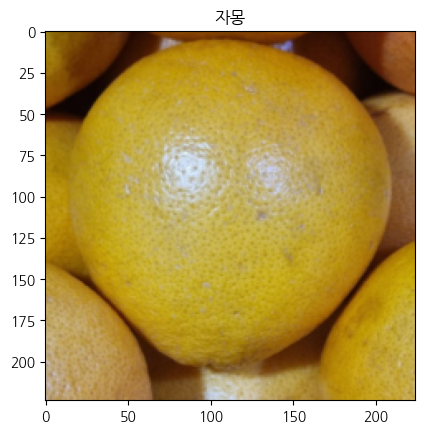

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


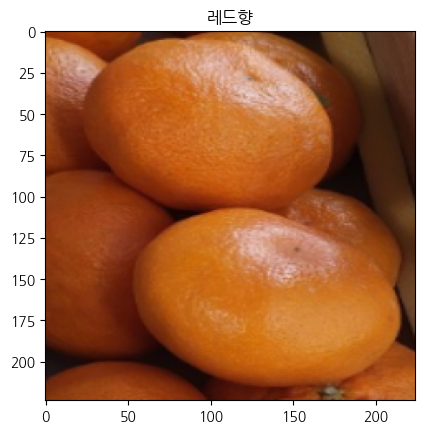

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


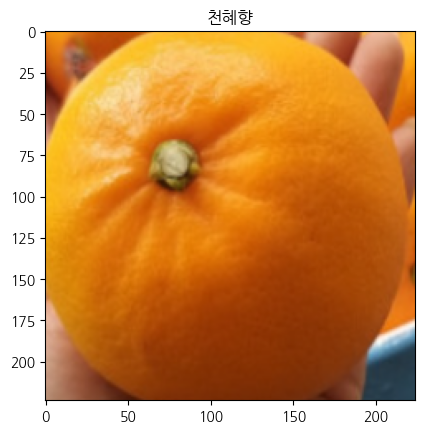

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


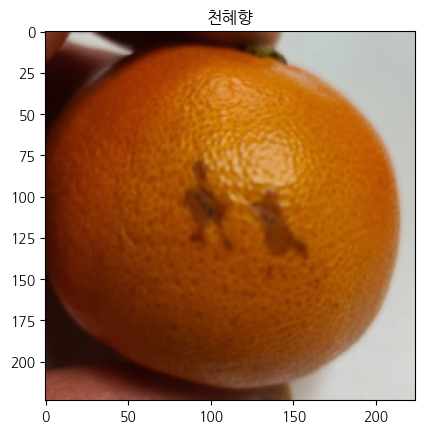

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


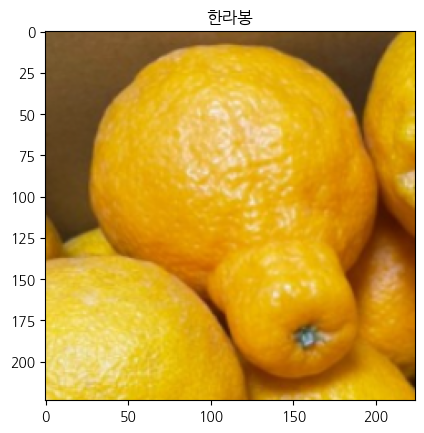

예측결과 : 한라봉  실제정답 : 자몽
(3, 224, 224)


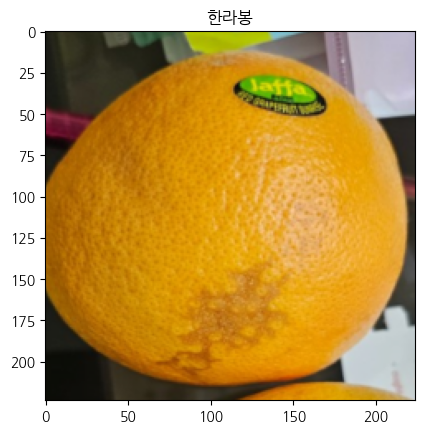

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


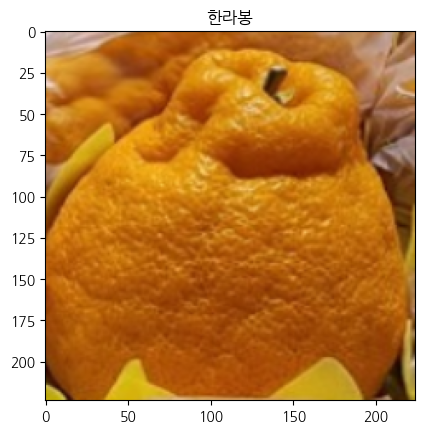

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


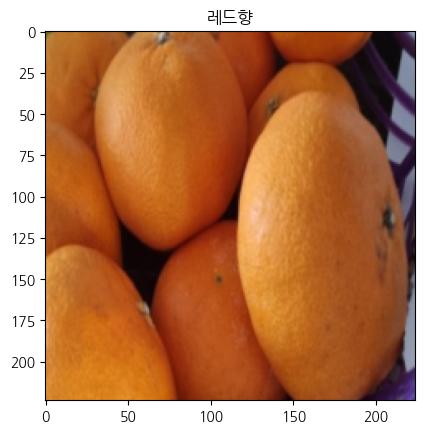

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


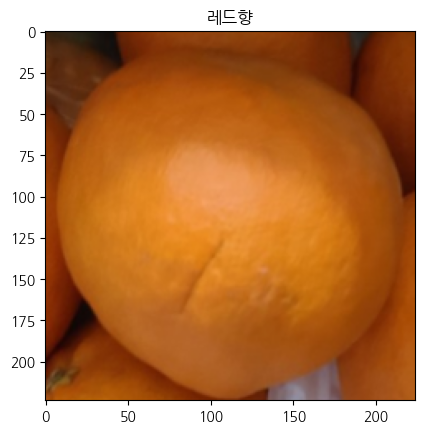

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


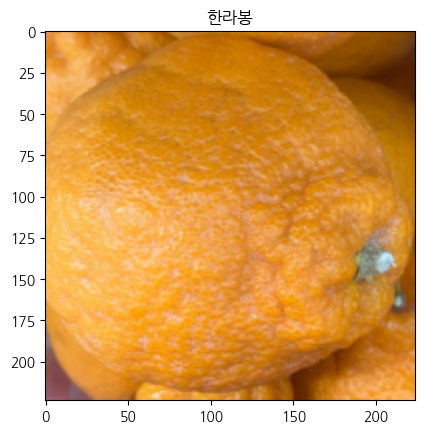

예측결과 : 레드향  실제정답 : 한라봉
(3, 224, 224)


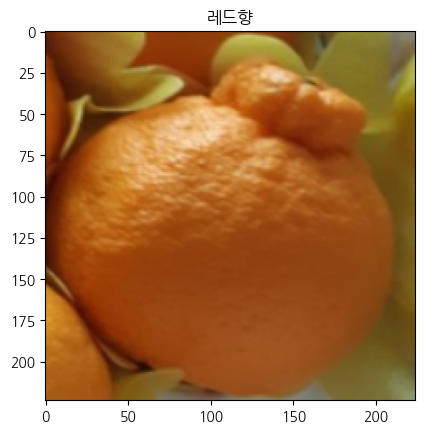

예측결과 : 자몽  실제정답 : 자몽
(3, 224, 224)


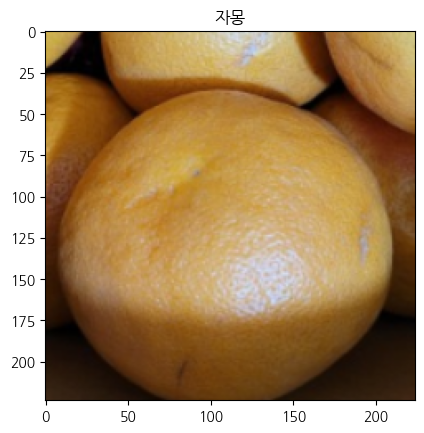

예측결과 : 한라봉  실제정답 : 한라봉
(3, 224, 224)


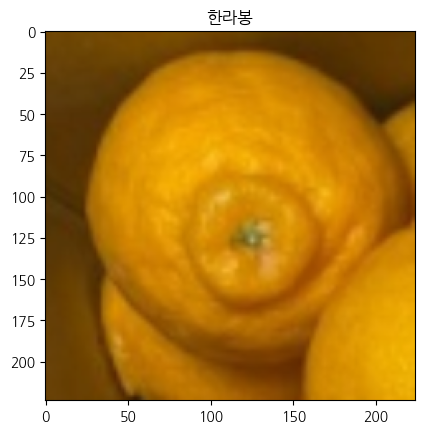

예측결과 : 레드향  실제정답 : 귤
(3, 224, 224)


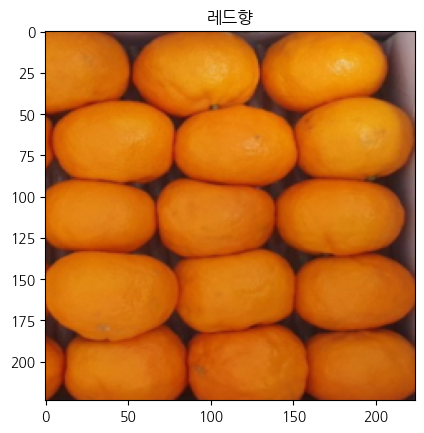

예측결과 : 천혜향  실제정답 : 천혜향
(3, 224, 224)


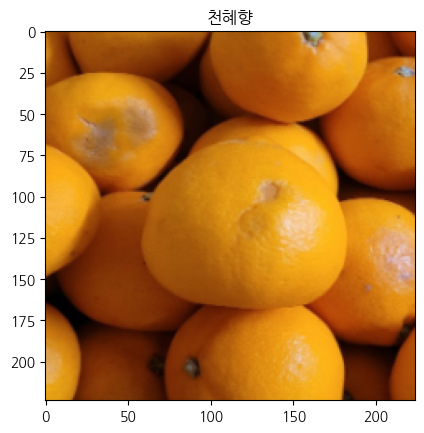

예측결과 : 레드향  실제정답 : 레드향
(3, 224, 224)


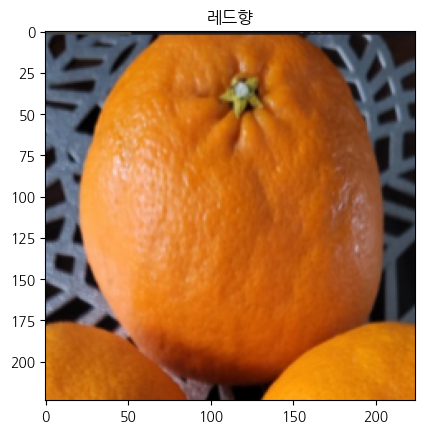

예측결과 : 자몽  실제정답 : 귤
(3, 224, 224)


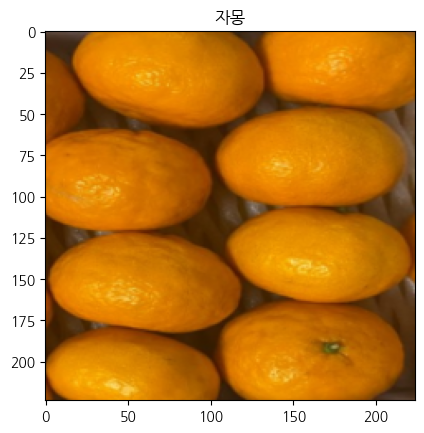

예측결과 : 귤  실제정답 : 귤
(3, 224, 224)


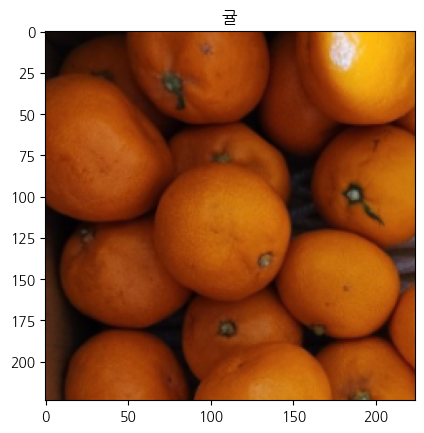

예측결과 : 천혜향  실제정답 : 귤
(3, 224, 224)


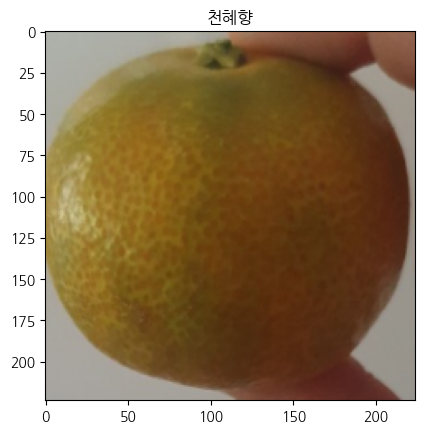

정확도 : 72.0


In [ ]:
model.eval()

with torch.no_grad():
    corrects = 0
    for data,labels in test_dataloader:
        preds = model(data.to(device))
        pred = torch.max(preds,1)[1]

        corrects += torch.sum(pred == labels.to(device).data)

        print(f'예측결과 : {class_names[pred[0]]}  실제정답 : {class_names[labels.data[0]]}')
        imshow(data.cpu().data[0], title=class_names[pred[0]])

    acc = corrects / len(test_datasets) * 100
    print(f'정확도 : {acc}')

In [ ]:
# 쓰기 종료
writer.close()

#코랩 안에서 띄우기위함
%load_ext tensorboard
#경로로 불러오기
%tensorboard --logdir=runs
# %tensorboard --logdir [경로] --port [포트번호]

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
torch.save(model.state_dict(),'orange_resnet34_version_5_new_data2.pth')

In [ ]:
from google.colab import files
files.download('/content/orange_resnet34_version_5_new_data2.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>